In [1]:
import pandas as pd
df = pd.read_csv("kp_prediction_dataset.csv")
df = df.drop('Unnamed: 0', axis =1)

In [7]:
df

,YYY,MM,DD,hours,hours_mins,days,days_m,Kp,ap,D,datetime_column,B,proton_density,flow_speed,DP,BZ,BI
0,2000,1,1,0.0,1.5,24837.000,24837.0625,5.333,56,1,2000-01-01,7.633333,-0.900000,2.566667,-9.913288e-06,4.066667,10.085697
1,2000,1,1,3.0,4.5,24837.125,24837.1875,4.667,39,1,2000-01-01,7.033333,-1.633333,2.033333,-1.129089e-05,2.066667,17.265064
2,2000,1,1,6.0,7.5,24837.250,24837.3125,4.000,27,1,2000-01-01,6.900000,-0.166667,1.800000,-9.028800e-07,2.766667,13.233588
3,2000,1,1,9.0,10.5,24837.375,24837.4375,3.333,18,1,2000-01-01,6.333333,0.700000,2.066667,4.998908e-06,3.500000,7.839617
4,2000,1,1,12.0,13.5,24837.500,24837.5625,4.333,32,1,2000-01-01,5.900000,0.200000,2.200000,1.618496e-06,3.433333,6.598002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43827,2014,12,31,9.0,10.5,30315.375,30315.4375,1.667,6,1,2014-12-31,4.333333,0.133333,7.733333,1.333240e-05,-2.500000,35.501924
43828,2014,12,31,12.0,13.5,30315.500,30315.5625,2.000,7,1,2014-12-31,4.300000,-1.666667,6.766667,-1.275953e-04,-1.633333,28.835251
43829,2014,12,31,15.0,16.5,30315.625,30315.6875,3.333,18,1,2014-12-31,5.300000,-0.166667,8.266667,-1.904346e-05,-1.433333,31.400939
43830,2014,12,31,18.0,19.5,30315.750,30315.8125,1.333,5,1,2014-12-31,5.733333,0.800000,4.633333,2.871530e-05,-0.600000,27.537192


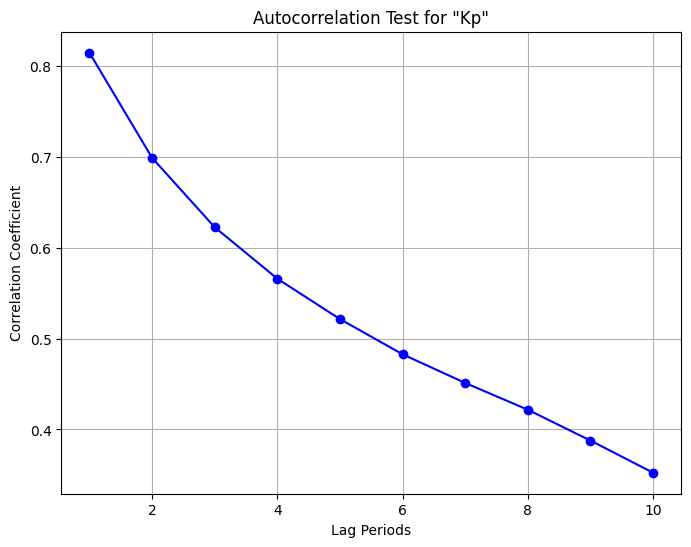

In [33]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming the data is stored in a DataFrame named 'df'
# If it's loaded from a CSV or other source, you can replace this line with your loading code
# df = pd.read_csv('your_data.csv')

def perform_autocorrelation_test(variable, lag_periods):
    lags = []
    correlations = []
    for lag in range(1, lag_periods+1):
        df[f'{variable}_lag_{lag}'] = df[variable].shift(lag)
        df_lagged = df.dropna()
        result = np.corrcoef(df_lagged[variable], df_lagged[f'{variable}_lag_{lag}'])[0, 1]
        lags.append(lag)
        correlations.append(result)
    
    return lags, correlations

# Replace 'kp' with the actual column name 'kp' you want to test
variable_name = 'Kp'
lags, correlations = perform_autocorrelation_test(variable_name, lag_periods=10)

# Plotting the line plot
plt.figure(figsize=(8, 6))
plt.plot(lags, correlations, marker='o', linestyle='-', color='b')
plt.xlabel('Lag Periods')
plt.ylabel('Correlation Coefficient')
plt.title(f'Autocorrelation Test for "{variable_name}"')
plt.grid(True)
plt.show()


In [35]:
df.columns

Index(['YYY', 'MM', 'DD', 'hours', 'hours_mins', 'days', 'days_m', 'Kp', 'ap',
       'D', 'datetime_column', 'B', 'proton_density', 'flow_speed', 'DP', 'BZ',
       'BI'],
      dtype='object')

In [31]:
df.drop(['Kp','Unnamed: 0', 'YYY', 'MM', 'DD', 'hours', 'hours_mins', 'days', 'days_m'], axis = 1).columns

Index(['ap', 'D', 'datetime_column', 'B', 'proton_density', 'flow_speed', 'DP',
       'BZ', 'BI', 'Kp_lag_1', 'Kp_lag_2', 'Kp_lag_3', 'Kp_lag_4', 'Kp_lag_5',
       'Kp_lag_6', 'Kp_lag_7', 'Kp_lag_8', 'Kp_lag_9', 'Kp_lag_10', 'ap_lag_1',
       'ap_lag_2', 'ap_lag_3', 'ap_lag_4', 'ap_lag_5', 'ap_lag_6', 'ap_lag_7',
       'ap_lag_8', 'ap_lag_9', 'ap_lag_10', 'D_lag_1', 'D_lag_2', 'D_lag_3',
       'D_lag_4', 'D_lag_5', 'D_lag_6', 'D_lag_7', 'D_lag_8', 'D_lag_9',
       'D_lag_10', 'datetime_column_lag_1'],
      dtype='object')

In [2]:
df.datetime_column = pd.to_datetime(df.datetime_column)

In [13]:
df[df.Kp > 5.0]

,YYY,MM,DD,hours,hours_mins,days,days_m,Kp,ap,D,datetime_column,B,proton_density,flow_speed,DP,BZ,BI
0,2000,1,1,0.0,1.5,24837.000,24837.0625,5.333,56,1,2000-01-01,7.633333,-0.900000,2.566667,-0.000010,4.066667,10.085697
86,2000,1,11,18.0,19.5,24847.750,24847.8125,5.333,56,1,2000-01-11,15.800000,-10.566667,8.200000,-0.001188,-3.766667,90.078265
87,2000,1,11,21.0,22.5,24847.875,24847.9375,5.333,56,1,2000-01-11,14.100000,-6.533333,4.466667,-0.000218,-5.733333,97.304692
174,2000,1,22,18.0,19.5,24858.750,24858.8125,5.333,56,1,2000-01-22,15.900000,-13.100000,19.966667,-0.008732,8.300000,21.775019
176,2000,1,23,0.0,1.5,24859.000,24859.0625,6.333,94,1,2000-01-23,16.200000,-15.100000,14.300000,-0.005163,1.533333,57.747649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42178,2014,6,8,6.0,7.5,30109.250,30109.3125,6.333,94,1,2014-06-08,20.100000,8.333333,29.400000,0.012043,-8.500000,141.207515
42759,2014,8,19,21.0,22.5,30181.875,30181.9375,5.333,56,1,2014-08-19,17.666667,-0.700000,14.833333,-0.000258,-16.766667,198.875009
42944,2014,9,12,0.0,1.5,30205.000,30205.0625,5.333,56,1,2014-09-12,12.600000,-2.233333,19.300000,-0.001391,6.500000,17.594251
42951,2014,9,12,21.0,22.5,30205.875,30205.9375,6.333,94,1,2014-09-12,24.766667,5.433333,10.966667,0.001093,-8.200000,157.344962


In [8]:
df[df[['Kp']]>5.0]

,YYY,MM,DD,hours,hours_mins,days,days_m,Kp,ap,D,datetime_column,B,proton_density,flow_speed,DP,BZ,BI
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.333,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
43828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
43829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN
43830,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
import pandas as pd

# # Read the dataset from the CSV file (adjust the file path accordingly)
# data = pd.read_csv('path/to/dataset.csv')

# # Sort the data by date (assuming you have a date column named 'Date')
# data.sort_values(by='Date', inplace=True)
data = df

# Create a new DataFrame for the "storm" dataset
storm_data = pd.DataFrame()

# Iterate through the original dataset and extract "storm" data
for i in range(6, len(data)):
    if data.loc[i, 'Kp'] > 5:
        # Create a new row for the "storm" dataset
        storm_row = {
            'YYY': data.loc[i, 'YYY'],
            'MM': data.loc[i, 'MM'],
            'DD': data.loc[i, 'DD'],
            'kp': data.loc[i, 'Kp'],
        }

        # Include the historical "kp" values for the last 6 days
        for j in range(1, 7):
            storm_row[f'kp_{j}'] = data.loc[i - j, 'Kp']

        # Append the row to the "storm" dataset
        storm_data = storm_data.append(storm_row, ignore_index=True)

# Create a new DataFrame for the "non-storm" dataset
# non_storm_data = data[data['Kp'] <= 5]

# Save the two datasets to separate CSV files
# storm_data.to_csv('path/to/storm_dataset.csv', index=False)
# non_storm_data.to_csv('path/to/non_storm_dataset.csv', index=False)


C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\61301432.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  storm_data = storm_data.append(storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\61301432.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  storm_data = storm_data.append(storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\61301432.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  storm_data = storm_data.append(storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\61301432.py:29: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  storm

In [25]:
data = df

# Create a new DataFrame for the "storm" dataset
non_storm_data = pd.DataFrame()

# Iterate through the original dataset and extract "storm" data
for i in range(6, len(data)):
    if data.loc[i, 'Kp'] < 5:
        # Create a new row for the "storm" dataset
        non_storm_row = {
            'YYY': data.loc[i, 'YYY'],
            'MM': data.loc[i, 'MM'],
            'DD': data.loc[i, 'DD'],
            'kp': data.loc[i, 'Kp'],
        }

        # Include the historical "kp" values for the last 6 days
        for j in range(1, 7):
            non_storm_row[f'kp_{j}'] = data.loc[i - j, 'Kp']

        # Append the row to the "storm" dataset
        non_storm_data = non_storm_data.append(non_storm_row, ignore_index=True)

C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\730996990.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  non_storm_data = non_storm_data.append(non_storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\730996990.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  non_storm_data = non_storm_data.append(non_storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\730996990.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  non_storm_data = non_storm_data.append(non_storm_row, ignore_index=True)
C:\Users\Swaroop\AppData\Local\Temp\ipykernel_15384\730996990.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future ver

In [23]:
storm_data

,YYY,MM,DD,kp,kp_1,kp_2,kp_3,kp_4,kp_5,kp_6
0,2000.0,1.0,11.0,5.333,3.667,3.667,2.333,1.667,2.333,3.000
1,2000.0,1.0,11.0,5.333,5.333,3.667,3.667,2.333,1.667,2.333
2,2000.0,1.0,22.0,5.333,3.333,3.333,3.000,2.333,2.333,1.333
3,2000.0,1.0,23.0,6.333,5.000,5.333,3.333,3.333,3.000,2.333
4,2000.0,1.0,23.0,5.667,6.333,5.000,5.333,3.333,3.333,3.000
...,...,...,...,...,...,...,...,...,...,...
897,2014.0,6.0,8.0,6.333,5.667,3.000,4.000,3.667,4.000,1.667
898,2014.0,8.0,19.0,5.333,3.667,2.667,1.667,2.667,2.000,0.667
899,2014.0,9.0,12.0,5.333,3.333,1.333,1.000,1.667,2.333,2.333
900,2014.0,9.0,12.0,6.333,4.667,5.000,1.667,3.000,2.000,4.333


In [26]:
non_storm_data

,YYY,MM,DD,kp,kp_1,kp_2,kp_3,kp_4,kp_5,kp_6
0,2000.0,1.0,1.0,4.333,3.000,4.333,3.333,4.000,4.667,5.333
1,2000.0,1.0,1.0,3.667,4.333,3.000,4.333,3.333,4.000,4.667
2,2000.0,1.0,2.0,3.000,3.667,4.333,3.000,4.333,3.333,4.000
3,2000.0,1.0,2.0,3.333,3.000,3.667,4.333,3.000,4.333,3.333
4,2000.0,1.0,2.0,3.333,3.333,3.000,3.667,4.333,3.000,4.333
...,...,...,...,...,...,...,...,...,...,...
42537,2014.0,12.0,31.0,1.667,1.333,2.333,1.333,2.333,2.667,2.667
42538,2014.0,12.0,31.0,2.000,1.667,1.333,2.333,1.333,2.333,2.667
42539,2014.0,12.0,31.0,3.333,2.000,1.667,1.333,2.333,1.333,2.333
42540,2014.0,12.0,31.0,1.333,3.333,2.000,1.667,1.333,2.333,1.333


In [58]:
df[df.datetime_column == "19-08-2013"]

C:\Users\Swaroop\AppData\Local\Temp\ipykernel_29288\518433184.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df[df.datetime_column == "19-08-2013"]


,YYY,MM,DD,hours,hours_mins,days,days_m,Kp,ap,D,datetime_column,B,proton_density,flow_speed,DP,BZ,BI
39832,2013,8,19,0.0,1.5,29816.000,29816.0625,1.667,6,1,2013-08-19,2.800000,0.533333,1.600000,2.282837e-06,-1.233333,20.024587
39833,2013,8,19,3.0,4.5,29816.125,29816.1875,1.333,5,1,2013-08-19,2.666667,1.200000,1.700000,5.798496e-06,-1.633333,22.587322
39834,2013,8,19,6.0,7.5,29816.250,29816.3125,0.667,3,1,2013-08-19,2.866667,0.600000,1.966667,3.880155e-06,-1.100000,19.301877
39835,2013,8,19,9.0,10.5,29816.375,29816.4375,0.667,3,1,2013-08-19,3.166667,1.433333,2.166667,1.125039e-05,-1.233333,21.454985
39836,2013,8,19,12.0,13.5,29816.500,29816.5625,1.333,5,1,2013-08-19,3.133333,-0.033333,2.100000,-2.457840e-07,-1.400000,22.556543
39837,2013,8,19,15.0,16.5,29816.625,29816.6875,1.333,5,1,2013-08-19,2.800000,-0.100000,1.966667,-6.466924e-07,-1.900000,25.189254
39838,2013,8,19,18.0,19.5,29816.750,29816.8125,0.667,3,1,2013-08-19,2.900000,1.166667,1.900000,7.041907e-06,-2.000000,26.347653
39839,2013,8,19,21.0,22.5,29816.875,29816.9375,0.667,3,1,2013-08-19,2.766667,1.400000,1.900000,8.450288e-06,-1.400000,21.152076


In [29]:
import pandas as pd

# Assuming you have the "storm" data in the DataFrame storm_data
# Assuming you have the "non-storm" data in the DataFrame non_storm_data

# Concatenate "storm" and "non-storm" dataframes
combined_data = pd.concat([storm_data, non_storm_data], ignore_index=True)

# Shuffle the combined dataframe
combined_data = combined_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Remove "year," "month," and "dd" columns (assuming you have columns named "year," "month," and "dd")
combined_data.drop(columns=['YYY', 'MM', 'DD'], inplace=True)

# Encode the "Kp" column based on whether it's greater or less than 5
combined_data['kp'] = combined_data['kp'].apply(lambda x: 1 if x > 5 else 0)

# The combined_data DataFrame now contains the shuffled and processed data
combined_data


,kp,kp_1,kp_2,kp_3,kp_4,kp_5,kp_6
0,0,2.333,1.667,2.000,2.667,1.333,1.667
1,0,2.333,4.000,2.000,1.667,1.000,0.333
2,0,0.333,1.333,1.333,0.000,0.333,1.333
3,0,0.000,0.000,0.333,0.000,0.667,1.333
4,0,6.333,3.667,2.667,3.000,2.333,0.333
...,...,...,...,...,...,...,...
43439,0,0.333,0.333,1.667,0.333,0.000,0.667
43440,0,2.667,3.333,2.667,2.000,4.333,3.333
43441,0,1.333,2.667,3.333,4.000,4.333,4.000
43442,1,6.667,2.333,2.000,1.333,1.667,1.333


In [33]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Assuming you have the preprocessed dataset in the DataFrame combined_data

# Extract the feature columns (excluding the target column "kp")
X = combined_data.drop(columns=['kp']).values

# Extract the target column "kp" for classification
y = combined_data['kp'].values

# Normalize the input data (optional but recommended for better training performance)
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Reshape the input data to 3D format (samples, timesteps, features)
# Assuming you want each data point to be treated as one timestep (timesteps = 1)
X_train = X_normalized.reshape(X_normalized.shape[0], 1, X_normalized.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Split the data into training and testing sets (you can adjust the ratio as needed)
X_train, X_test, y_train, y_test = train_test_split(X_train, y, test_size=0.2, random_state=42)

# LSTM model architecture
model = Sequential()
model.add(LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Training the model
epochs = 50
batch_size = 16

model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1)

# Evaluating the model on the test set
loss, accuracy = model.evaluate(X_test, y_test, batch_size=batch_size, verbose=0)
print(f'Test loss: {loss:.4f}, Test accuracy: {accuracy:.4f}')


Epoch 1/50
2173/2173 [==============================] - 8s 2ms/step - loss: 0.1202 - accuracy: 0.9791
Epoch 2/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0543 - accuracy: 0.9824
Epoch 3/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0510 - accuracy: 0.9832
Epoch 4/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0503 - accuracy: 0.9830
Epoch 5/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0499 - accuracy: 0.9837
Epoch 6/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0500 - accuracy: 0.9836
Epoch 7/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0499 - accuracy: 0.9837
Epoch 8/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0500 - accuracy: 0.9834
Epoch 9/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.0497 - accuracy: 0.9837
Epoch 10/50
2173/2173 [==============================] - 5s 2ms/step - loss: 0.049

In [37]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Assuming you have the "storm" data in the DataFrame storm_data

# Extract the feature columns (excluding the target column "kp")
X = storm_data.drop(columns=['kp', 'DD','MM','YYY']).values

# Extract the target column "kp" for classification
y = storm_data['kp'].values

# Normalize the input data (optional but recommended for better training performance)
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Reshape the input data to 3D format (samples, timesteps, features)
# Assuming you want each data point to be treated as one timestep (timesteps = 1)
X_test = X_normalized.reshape(X_normalized.shape[0],1,  X_normalized.shape[1])

# Load the pretrained LSTM model
model

# Evaluating the model on the test set
loss, accuracy = model.evaluate(X_test, y, batch_size=16, verbose=0)
print(f'Test loss: {loss:.4f}, Test accuracy: {accuracy:.4f}')


Test loss: 7.1826, Test accuracy: 0.0000


c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-

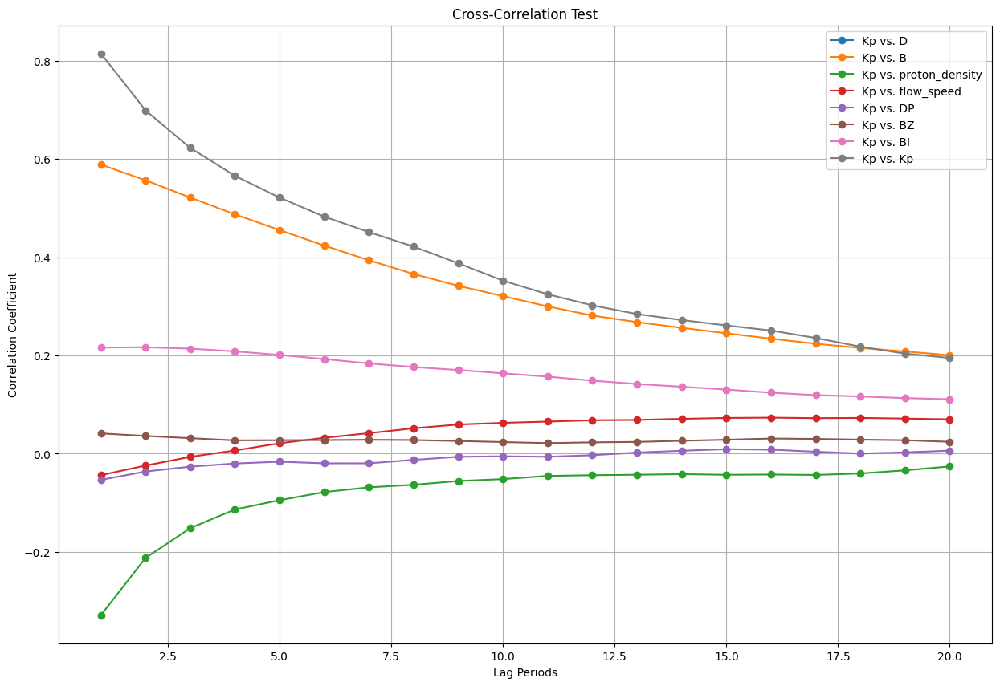

In [54]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt


df = pd.read_csv("kp_prediction_dataset.csv")
df = df.drop('Unnamed: 0', axis =1)

# Assuming the data is stored in a DataFrame named 'df'
# If it's loaded from a CSV or other source, you can replace this line with your loading code
# df = pd.read_csv('your_data.csv')

def perform_cross_correlation_test(variable1, variable2, lag_periods):
    lags = []
    correlations = []
    for lag in range(1, lag_periods+1):
        df[f'{variable1}_lag_{lag}'] = df[variable1].shift(lag)
        df[f'{variable2}_lag_{lag}'] = df[variable2].shift(lag)
        df_lagged = df.dropna()
        result = np.corrcoef(df_lagged[variable1], df_lagged[f'{variable2}_lag_{lag}'])[0, 1]
        lags.append(lag)
        correlations.append(result)
    
    return lags, correlations

# Replace 'kp' and 'ap' with the actual column names you want to test for cross-correlation
variable1_name = 'Kp'

plt.figure(figsize=(15, 10))
for column_name in df.drop(['Kp', 'ap', 'datetime_column', 'YYY', 'MM', 'DD', 'hours', 'hours_mins', 'days', 'days_m'], axis = 1).columns:
    # print(column_name)
    
    lags, correlations = perform_cross_correlation_test(variable1_name, column_name, lag_periods=20)

    # Plotting the line plot
   
    plt.plot(lags, correlations, marker='o', linestyle='-', label=f'{variable1_name} vs. {column_name}')
    plt.xlabel('Lag Periods')
    plt.ylabel('Correlation Coefficient')
    plt.title(f'Cross-Correlation Test')
    plt.grid(True)




lags, correlations = perform_autocorrelation_test(variable_name, lag_periods=20)

# Plotting the line plot
# plt.figure(figsize=(8, 6))
plt.plot(lags, correlations, marker='o', linestyle='-',  label = f'{variable1_name} vs. {variable1_name}' )
plt.legend()
plt.show()


In [60]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg


In [61]:
transformed_df = series_to_supervised(df[["proton_density","flow_speed", "Kp"]][:], n_in = 6, n_out = 1)
transformed_df = transformed_df.drop(['var1(t)', 'var2(t)'], axis = 1)

In [62]:
# transformed_df = transformed_df.drop(['var1(t)', 'var2(t)'])
transformed_df.columns

Index(['var1(t-6)', 'var2(t-6)', 'var3(t-6)', 'var1(t-5)', 'var2(t-5)',
       'var3(t-5)', 'var1(t-4)', 'var2(t-4)', 'var3(t-4)', 'var1(t-3)',
       'var2(t-3)', 'var3(t-3)', 'var1(t-2)', 'var2(t-2)', 'var3(t-2)',
       'var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var3(t)'],
      dtype='object')

In [63]:
X = transformed_df.drop('var3(t)', axis = 1)
y = transformed_df[['var3(t)']]



train_X, train_y = X[:int(len(X)*0.8)][:], y[:int(len(X)*0.8)][:]
test_X, test_y = X[int(len(X)*0.8):][:], y[int(len(X)*0.8):][:]

In [ ]:
def get_data(lag = 27, reshape = True):
    df = pd.read_csv('data.csv')
    df.drop('Unnamed: 0', inplace = True, axis = 1)
    df.columns = ['Date', 'sfu']
    df.Date = pd.to_datetime(df.Date)
    train_data = df[(df['Date'].dt.year < 2003) & (df['Date'].dt.year > 1979)]
    val_data = df[(df['Date'].dt.year >= 2003) & (df['Date'].dt.year <= 2014)]  
    test_data = df[(df['Date'].dt.year >= 2014) & (df['Date'].dt.year <= 2016)]    
    train_X, train_y = split_sequence(np.array(train_data['sfu']), lag)
    val_X, val_y = split_sequence(np.array(val_data['sfu']), lag)
    test_X, test_y = split_sequence(np.array(test_data['sfu']), lag)
    if reshape:    
        train_X = train_X.reshape((train_X.shape[0], lag, 1))
        val_X = val_X.reshape((val_X.shape[0], lag, 1))
        test_X = test_X.reshape((test_X.shape[0], lag, 1))
    return train_X, train_y, val_X, val_y, test_X, test_y

In [64]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, MaxPooling1D, Flatten, Conv1D, TimeDistributed
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import pathlib

class LSTM2_multistep():
    def __init__(self, in_steps, out_steps):
        self.model = self.build_model(in_steps, out_steps)
        self.model_root = 'kp_models/'
        self.model_name = 'kp_LSTM2_multistep.h5'
        self.model_path = self.model_root + self.model_name
        
    def build_model(self, in_steps, out_steps):
        model = Sequential()
        model.add(LSTM(64, activation='relu', return_sequences= True, input_shape = (in_steps, 1)))
        # model.add(LSTM(128, activation='relu', return_sequences=True))
        model.add(LSTM(64, activation='relu', return_sequences= True))
        model.add(LSTM(32, activation='relu'))
        model.add(Dense(out_steps))
        model.compile(loss='mse', optimizer='adam')

        optimizer = Adam(lr=0.001)
        model.compile(optimizer=optimizer, loss='mse')
        self.model = model
        print("MLP moedel built!")
        
        return self.model
    
    def train(self,train_X, train_y, test_X, test_y, verbose = 1, epochs = 100,in_steps = 27, out_steps = 7):
        # if self.model == None:
        #   model =  self.build_model(in_steps= in_steps, out_steps= out_steps)
        model = self.model
        checkpoint = ModelCheckpoint(self.model_path, monitor='val_loss', save_best_only=True, save_weights_only=True, save_freq=5, verbose = 1)
        model.fit(train_X, train_y, epochs = epochs, verbose = verbose, validation_data = (test_X, test_y), callbacks=[checkpoint])
        self.model = model
          
    def evaluate(self, test_X, test_y):
        model = self.model
        model.load_weights(self.model_path)
        # Assuming you have your true values in 'y_true' and predicted values in 'y_pred'
        pred_y = model.predict(test_X)
        RMSE_scores = []
        R2_scores = []
        MAE_scores = []    
        for i in range(test_y.shape[1]):
            mse = mean_squared_error(test_y[:, i], pred_y[:,  i])
            rmse = np.sqrt(mse)
            RMSE_scores.append(rmse)
            
        for i in range(test_y.shape[1]):
            r2 = r2_score(test_y[:, i], pred_y[:,  i])        
            R2_scores.append(r2)
            
        for i in range(test_y.shape[1]):
            mae = mean_absolute_error(test_y[:, i], pred_y[:,  i])        
            MAE_scores.append(r2)
            
        total_score = 0
        for row in range(test_y.shape[0]):
            for col in range(pred_y.shape[1]):
                total_score += (test_y[row, col] - pred_y[row, col]**2)
                total_score = np.sqrt(total_score/(test_y.shape[0] * test_y.shape[1]))
                
        return RMSE_scores, MAE_scores, R2_scores, total_score, pred_y

    

In [86]:
in_steps = 18
out_steps = 1
lstm2_multistep = LSTM2_multistep(in_steps, out_steps)
# train_X, train_y, test_X, test_y = get_data_multistep(in_steps, out_steps)
train_X = np.array(train_X).reshape(train_X.shape[0], train_X.shape[1], 1)
test_X = np.array(test_X).reshape(test_X.shape[0], test_X.shape[1], 1)
lstm2_multistep.train(train_X, train_y, test_X, test_y, in_steps= in_steps, out_steps= out_steps)

c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


MLP moedel built!
Epoch 1/100
1096/1096 [==============================] - 25s 20ms/step - loss: 1.8675 - val_loss: 0.6569
Epoch 2/100
1096/1096 [==============================] - 25s 23ms/step - loss: 0.7192 - val_loss: 0.6367
Epoch 3/100
1096/1096 [==============================] - 24s 22ms/step - loss: 0.6800 - val_loss: 0.6060
Epoch 4/100
1096/1096 [==============================] - 22s 20ms/step - loss: 0.6554 - val_loss: 0.6400
Epoch 5/100
1096/1096 [==============================] - 24s 22ms/step - loss: 0.6501 - val_loss: 0.5720
Epoch 6/100
1096/1096 [==============================] - 23s 21ms/step - loss: 0.6373 - val_loss: 0.5845
Epoch 7/100
1096/1096 [==============================] - 24s 22ms/step - loss: 0.6348 - val_loss: 0.5828
Epoch 8/100
1096/1096 [==============================] - 25s 22ms/step - loss: 0.6267 - val_loss: 0.5785
Epoch 9/100
1096/1096 [==============================] - 23s 21ms/step - loss: 0.6237 - val_loss: 0.5808
Epoch 10/100
1096/1096 [=============

KeyboardInterrupt: 

In [76]:
print(len(df[df['Kp']>4.0]))
print(len(df))
print(len(df[df['Kp']<0.5]))

2623
43832
7996


In [95]:
RMSE_scores, MAE_scores, R2_scores, total_score, pred_y = lstm2_multistep.evaluate(test_X = test_X, test_y = test_y)
print("R2 score:", R2_scores)
print("\nRMSE: ", RMSE_scores) 
print("\nMAe, scores: ", MAE_scores) 

274/274 [==============================] - 2s 7ms/step


InvalidIndexError: (slice(None, None, None), 0)

In [11]:
test_y.shape

(8766, 1)

In [12]:
import matplotlib.pyplot as plt
# plt.plot()
pred_y  = lstm2_multistep.model.predict(test_X)

274/274 [==============================] - 2s 6ms/step


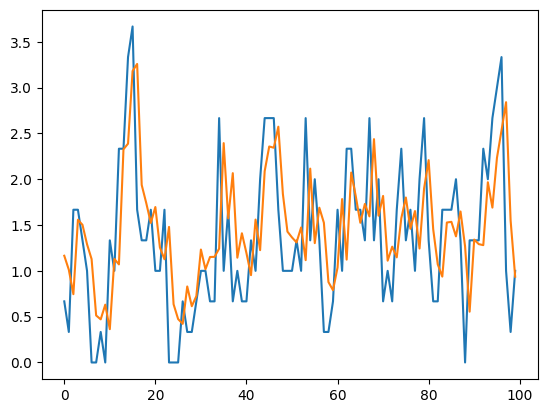

In [96]:

plt.plot(np.array(test_y[:100]))
plt.plot(pred_y[:100])


In [77]:
import pandas as pd
wind_df = pd.read_csv("wind_data.csv")

In [82]:
wind_df.columns

Index(['Unnamed: 0', 'YEAR', 'DOY', 'HR', 'B', 'BX', 'BY', 'BZ',
       'SW Proton Density, N/cm^3', 'SW Plasma Speed, km/s', 'Alfen mech no',
       'magnetosonic mech num', 'Kp index', 'Sunspot No', 'Dst-index, nT',
       'f10.7_index'],
      dtype='object')

In [103]:
wind_df

Unnamed: 0                     int64
YEAR                           int64
DOY                            int64
HR                             int64
B                            float64
BX                           float64
BY                           float64
BZ                           float64
SW Proton Density, N/cm^3    float64
SW Plasma Speed, km/s        float64
Alfen mech no                float64
magnetosonic mech num        float64
Kp index                     float64
Sunspot No                     int64
Dst-index, nT                  int64
f10.7_index                  float64
dtype: object

In [101]:
import pandas as pd
from scipy import stats

# Assuming your DataFrame is named 'df'
z_scores = stats.zscore(df)
threshold = 3
outliers = df[(z_scores > threshold).any(axis=1)]


c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\scipy\stats\_stats_py.py:112: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  warnings.warn("The input array could not be properly "


TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [97]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, f1_score

r2_score(pred_y, test_y)

0.37252451137592335

In [92]:
test_X[-1].reshape(1, 18, 1)

array([[[ 3.06919866e+01],
        [-1.63663157e-21],
        [ 2.33300000e+00],
        [ 1.51223547e+01],
        [ 2.82394607e-06],
        [ 1.33300000e+00],
        [ 3.55019243e+01],
        [ 1.33324041e-05],
        [ 1.66700000e+00],
        [ 2.88352506e+01],
        [-1.27595274e-04],
        [ 2.00000000e+00],
        [ 3.14009387e+01],
        [-1.90434607e-05],
        [ 3.33300000e+00],
        [ 2.75371918e+01],
        [ 2.87152996e-05],
        [ 1.33300000e+00]]])

In [99]:
input.flatten().tolist()

[30.69198663144777,
 -1.6366315710077596e-21,
 2.333,
 15.122354654944914,
 2.8239460740740733e-06,
 1.333,
 35.50192431483618,
 1.3332404148148143e-05,
 1.667,
 28.83525055079966,
 -0.000127595274074,
 2.0,
 31.40093871052433,
 -1.9043460740740747e-05,
 3.333,
 27.53719183667225,
 2.871529955555556e-05,
 1.333]

In [95]:
input = test_X[-1].reshape(1, 18, 1)
input_list = input.flatten()
for i in range(out_steps):
    
    prediction = lstm2_multistep.model.predict(input)[0][0]


1/1 [==============================] - 0s 34ms/step


1.4085032

In [ ]:
np

In [100]:
print(mean_absolute_error(test_y, pred_y))
print(np.sqrt(mean_squared_error(test_y, pred_y)))
# print(f1_score(test_y, pred_y))

0.5921023458574234
0.7730958052380679


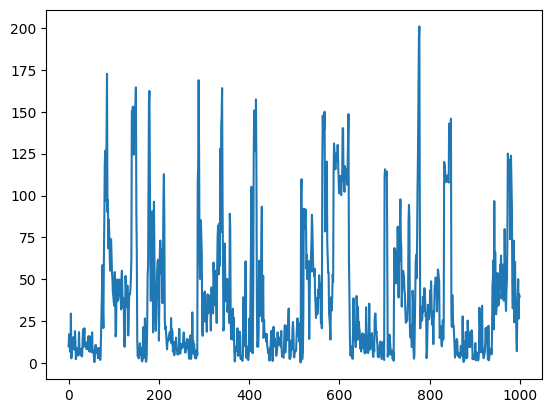

In [54]:
plt.plot(df[['BI']][:1000])

In [57]:
pd.read_csv("boyle_index.txt", delimiter = " ")

ParserError: Error tokenizing data. C error: Expected 6 fields in line 163941, saw 11


In [68]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, MaxPooling1D, Flatten, Conv1D, TimeDistributed
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import pathlib

class MLP():
    def __init__(self):
        self.model = None
        self.model_root = 'models/'
        self.model_name = 'MLP.h5'
        self.model_path = self.model_root + self.model_name
        
    def build_model(self, lag):
        model = model = Sequential()
        model.add(Dense(128, activation = 'relu'))
        model.add(Dense(10, activation = "tanh"))
        model.add(Dense(1))
        model.compile(loss='mse', optimizer='adam')

        optimizer = Adam(lr=0.001)
        model.compile(optimizer=optimizer, loss='mse')
        self.model = model
        print("MLP moedel built!")
        
        return self.model
    
    def train(self,train_X, train_y, test_X, test_y, verbose = 1, epochs = 100, lag = 27):
        if self.model == None:
          model =  self.build_model(lag)
        checkpoint = ModelCheckpoint(self.model_path, monitor='val_loss', save_best_only=True, save_weights_only=True)
        model.fit(train_X, train_y, epochs = epochs, verbose = verbose, validation_data = (test_X, test_y), callbacks=[checkpoint])
        self.model = model
          
    def evaluate(self, test_X, test_y):
        model = self.model
        model.load_weights(self.model_path)
        # Assuming you have your true values in 'y_true' and predicted values in 'y_pred'
        pred_y = model.predict(test_X)
        r2 = r2_score(test_y, pred_y)
        rmse = np.sqrt(mean_squared_error(test_y, pred_y))
        print("R2 score:", r2)
        print("RMSE: ", rmse)        
        return r2, rmse, pred_y

        
    def plot(self):
        plt.plot()
          
        

In [69]:
mlp = MLP()
# train_X, train_y, test_X, test_y = get_data(27, reshape = False)
mlp.train(train_X, train_y, test_X, test_y)

MLP moedel built!
Epoch 1/100


c:\Users\Swaroop\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


1096/1096 [==============================] - 4s 3ms/step - loss: 1.9097 - val_loss: 1.5128
Epoch 2/100
1096/1096 [==============================] - 4s 3ms/step - loss: 1.8615 - val_loss: 1.5459
Epoch 3/100
1096/1096 [==============================] - 4s 4ms/step - loss: 1.8578 - val_loss: 1.4774
Epoch 4/100
1096/1096 [==============================] - 4s 3ms/step - loss: 1.8579 - val_loss: 1.4831
Epoch 5/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8569 - val_loss: 1.5070
Epoch 6/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8563 - val_loss: 1.4908
Epoch 7/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8567 - val_loss: 1.4829
Epoch 8/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8572 - val_loss: 1.5474
Epoch 9/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8554 - val_loss: 1.5147
Epoch 10/100
1096/1096 [==============================] - 3s 3ms/step - loss: 1.8557 

KeyboardInterrupt: 

In [67]:
train_X.shape

(35060, 18, 1)

In [66]:
test_y.shape

(8766, 1)

In [70]:
r2, rmse, y_preds = mlp.evaluate(test_X = test_X, test_y = test_y)

274/274 [==============================] - 1s 3ms/step


ValueError: Found array with dim 3. None expected <= 2.

In [72]:
pred_y.shape

(8766, 18, 1)

In [64]:
test_y.shape

(8766, 1)

In [71]:
pred_y = mlp.model.predict(test_X)
r2_score(pred_y, test_y)

274/274 [==============================] - 1s 2ms/step


ValueError: Found array with dim 3. None expected <= 2.